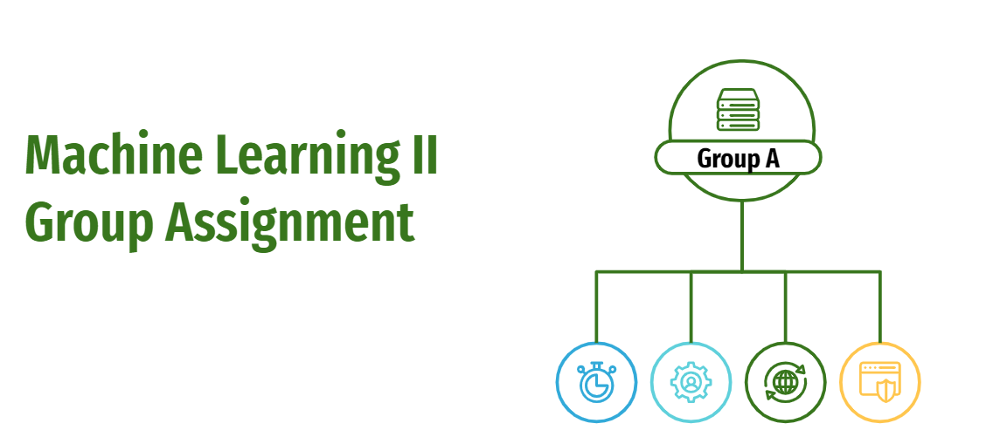

# <font color=green> Introduction </font>

The assignment is focused on solving the Forest Cover Type Prediction: https://www.kaggle.com/c/forest-cover-type-prediction/overview. This task proposes a classification problem: predict the forest cover type (the predominant kind of tree cover) from strictly cartographic variables (as opposed to remotely sensed data).

The study area includes four wilderness areas located in the Roosevelt National Forest of northern Colorado. Each observation is a 30m x 30m patch. You are asked to predict an integer classification for the forest cover type. The seven types are:

1. Spruce/Fir
2. Lodgepole Pine
3. Ponderosa Pine
4. Cottonwood/Willow
5. Aspen
6. Douglas-fir
7. Krummholz

The training set (15120 observations) contains both features and the Cover_Type. The test set contains only the features. 

**You must predict the Cover_Type for every row in the test set (565892 observations).**

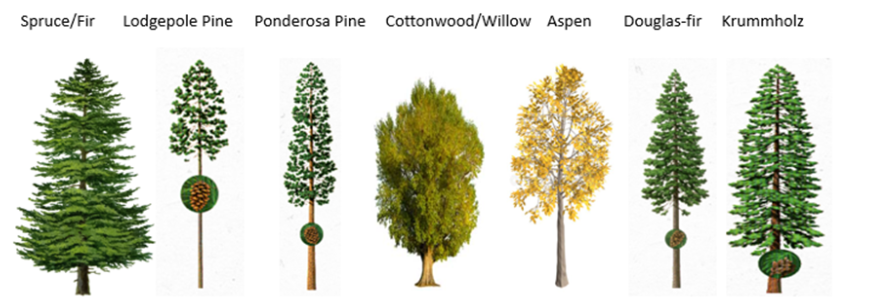

## How to work on the assignment

I expect 3 files from each group:
* **A file containing the best predictions from your best model (20%)**
* **A Jupyter notebook containing all the work the team did in order to deliver the best predictions (40%)**
* **A business report (40%)** explaining:
    * The goal
    * The work performed: include some detail about data cleaning, feature engineering and modelling
    * The results: meaningful metrics for the best models
    * Visualizations

No group presentation is expected for this assignment.

# <font color=green> Table of contents </font>

* Understand, Clean and Format Data
* Exploratory Data Analysis
* Feature Engineering & Selection
* Compare Several Machine Learning Models
* Perform Hyperparameter Tuning on the Best Model
* Interpret Model Results
* Evaluate the Best Model with Test Data (replying the initiating question)
* Summary & Conclusions

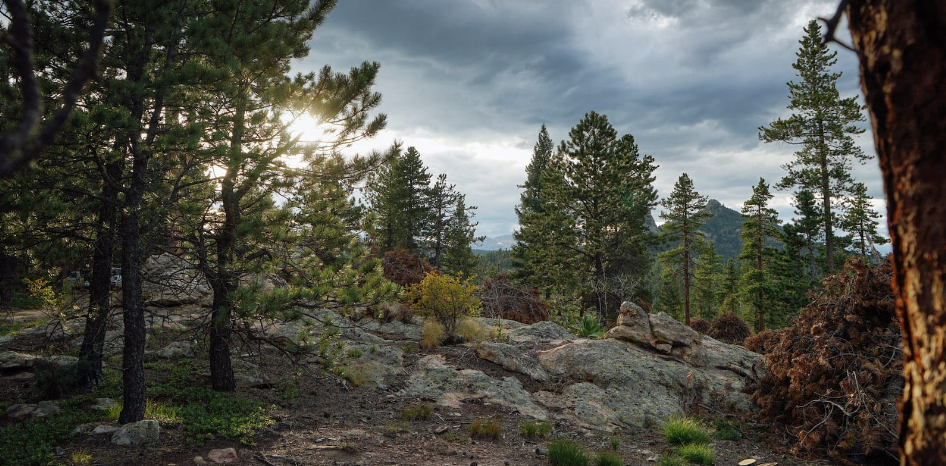

# <font color=green> Libaries used </font>

In [1]:
pip install squarify

Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas as pd
import numpy as np
import seaborn as sns  # Graphing
import matplotlib.pyplot as plt
import squarify #treemap

<a id='1'></a>
##  <font color=green>1.Import the Data </font>
Let’s load the training data and create data frame

In [3]:
data = pd.read_csv("train.csv")
data.head()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,1,2596,51,3,258,0,510,221,232,148,...,0,0,0,0,0,0,0,0,0,5
1,2,2590,56,2,212,-6,390,220,235,151,...,0,0,0,0,0,0,0,0,0,5
2,3,2804,139,9,268,65,3180,234,238,135,...,0,0,0,0,0,0,0,0,0,2
3,4,2785,155,18,242,118,3090,238,238,122,...,0,0,0,0,0,0,0,0,0,2
4,5,2595,45,2,153,-1,391,220,234,150,...,0,0,0,0,0,0,0,0,0,5


In [4]:
data.tail()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
15115,15116,2607,243,23,258,7,660,170,251,214,...,0,0,0,0,0,0,0,0,0,3
15116,15117,2603,121,19,633,195,618,249,221,91,...,0,0,0,0,0,0,0,0,0,3
15117,15118,2492,134,25,365,117,335,250,220,83,...,0,0,0,0,0,0,0,0,0,3
15118,15119,2487,167,28,218,101,242,229,237,119,...,0,0,0,0,0,0,0,0,0,3
15119,15120,2475,197,34,319,78,270,189,244,164,...,0,0,0,0,0,0,0,0,0,3


<a id='2'></a>
# <font color=green>2. Data analysis</font>
To understand dataframe, let’s look at the data types, the data shape and descriptive statistics.
All features are integers. 

<a id='2.1'></a>
## <font color=green>__2.1.Explanation of variables__</font><br>
__Elevation__ / quantitative /meters / Elevation in meters <br>
__Aspect__ / quantitative / azimuth / Aspect in degrees azimuth <br>
__Slope__ / quantitative / degrees / Slope in degrees <br>
__Horizontal_Distance_To_Hydrology__ / quantitative / meters / Horz Dist to nearest surface water features <br>
__Vertical_Distance_To_Hydrology__ / quantitative / meters / Vert Dist to nearest surface water features <br>
__Horizontal_Distance_To_Roadways__ / quantitative / meters / Horz Dist to nearest roadway <br>
__Hillshade_9am__ / quantitative / 0 to 255 index / Hillshade index at 9am, summer solstice <br>
__Hillshade_Noon__ / quantitative / 0 to 255 index / Hillshade index at noon, summer soltice <br>
__Hillshade_3pm__ / quantitative / 0 to 255 index / Hillshade index at 3pm, summer solstice <br>
__Horizontal_Distance_To_Fire_Points__ / quantitative / meters / Horz Dist to nearest wildfire ignition points <br>
__Wilderness_Area (4 binary columns)__ / qualitative / 0 (absence) or 1 (presence) / Wilderness area designation <br>
__Soil_Type (40 binary columns)__ / qualitative / 0 (absence) or 1 (presence) / Soil Type designation <br>
__Cover_Type (7 types)__ / integer / 1 to 7 / Forest Cover Type designation <br>


The wilderness areas are:

1 - Rawah Wilderness Area <br>
2 - Neota Wilderness Area  <br>
3 - Comanche Peak Wilderness Area<br>
4 - Cache la Poudre Wilderness Area<br>

The soil types are:<br>

1 Cathedral family - Rock outcrop complex, extremely stony.<br>
2 Vanet - Ratake families complex, very stony.<br>
3 Haploborolis - Rock outcrop complex, rubbly.<br>
4 Ratake family - Rock outcrop complex, rubbly.<br>
5 Vanet family - Rock outcrop complex complex, rubbly.<br>
6 Vanet - Wetmore families - Rock outcrop complex, stony.<br>
7 Gothic family.<br>
8 Supervisor - Limber families complex.<br>
9 Troutville family, very stony.<br>
10 Bullwark - Catamount families - Rock outcrop complex, rubbly.<br>
11 Bullwark - Catamount families - Rock land complex, rubbly.<br>
12 Legault family - Rock land complex, stony.<br>
13 Catamount family - Rock land - Bullwark family complex, rubbly.<br>
14 Pachic Argiborolis - Aquolis complex.<br>
15 unspecified in the USFS Soil and ELU Survey.<br>
16 Cryaquolis - Cryoborolis complex.<br>
17 Gateview family - Cryaquolis complex.<br>
18 Rogert family, very stony.<br>
19 Typic Cryaquolis - Borohemists complex.<br>
20 Typic Cryaquepts - Typic Cryaquolls complex.<br>
21 Typic Cryaquolls - Leighcan family, till substratum complex.<br>
22 Leighcan family, till substratum, extremely bouldery.<br>
23 Leighcan family, till substratum - Typic Cryaquolls complex.<br>
24 Leighcan family, extremely stony.<br>
25 Leighcan family, warm, extremely stony.<br>
26 Granile - Catamount families complex, very stony.<br>
27 Leighcan family, warm - Rock outcrop complex, extremely stony.<br>
28 Leighcan family - Rock outcrop complex, extremely stony.<br>
29 Como - Legault families complex, extremely stony.<br>
30 Como family - Rock land - Legault family complex, extremely stony.<br>
31 Leighcan - Catamount families complex, extremely stony.<br>
32 Catamount family - Rock outcrop - Leighcan family complex, extremely stony.<br>
33 Leighcan - Catamount families - Rock outcrop complex, extremely stony.<br>
34 Cryorthents - Rock land complex, extremely stony.<br>
35 Cryumbrepts - Rock outcrop - Cryaquepts complex.<br>
36 Bross family - Rock land - Cryumbrepts complex, extremely stony.<br>
37 Rock outcrop - Cryumbrepts - Cryorthents complex, extremely stony.<br>
38 Leighcan - Moran families - Cryaquolls complex, extremely stony.<br>
39 Moran family - Cryorthents - Leighcan family complex, extremely stony.<br>
40 Moran family - Cryorthents - Rock land complex, extremely stony.<br>
Source: https://www.kaggle.com/competitions/forest-cover-type-prediction/data

In [5]:
data.dtypes

Id                                    int64
Elevation                             int64
Aspect                                int64
Slope                                 int64
Horizontal_Distance_To_Hydrology      int64
Vertical_Distance_To_Hydrology        int64
Horizontal_Distance_To_Roadways       int64
Hillshade_9am                         int64
Hillshade_Noon                        int64
Hillshade_3pm                         int64
Horizontal_Distance_To_Fire_Points    int64
Wilderness_Area1                      int64
Wilderness_Area2                      int64
Wilderness_Area3                      int64
Wilderness_Area4                      int64
Soil_Type1                            int64
Soil_Type2                            int64
Soil_Type3                            int64
Soil_Type4                            int64
Soil_Type5                            int64
Soil_Type6                            int64
Soil_Type7                            int64
Soil_Type8                      

We have 56 features with the test set consist of 15120 rows. 

In [6]:
data.shape

(15120, 56)

Vertical_Distance_To_Hydrology seems to have positive and negative values, the negative values could be explained by values below the sea level. 

In [7]:
data.describe()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
count,15120.00000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,...,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000
mean,7560.50000,2749.322553,156.676653,16.501587,227.195701,51.076521,1714.023214,212.704299,218.965608,135.091997,...,0.045635,0.040741,0.001455,0.006746,0.000661,0.002249,0.048148,0.043452,0.030357,4.000000
std,4364.91237,417.678187,110.085801,8.453927,210.075296,61.239406,1325.066358,30.561287,22.801966,45.895189,...,0.208699,0.197696,0.038118,0.081859,0.025710,0.047368,0.214086,0.203880,0.171574,2.000066
min,1.00000,1863.000000,0.000000,0.000000,0.000000,-146.000000,0.000000,0.000000,99.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,3780.75000,2376.000000,65.000000,10.000000,67.000000,5.000000,764.000000,196.000000,207.000000,106.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
50%,7560.50000,2752.000000,126.000000,15.000000,180.000000,32.000000,1316.000000,220.000000,223.000000,138.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000
75%,11340.25000,3104.000000,261.000000,22.000000,330.000000,79.000000,2270.000000,235.000000,235.000000,167.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000
max,15120.00000,3849.000000,360.000000,52.000000,1343.000000,554.000000,6890.000000,254.000000,254.000000,248.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,7.000000


<a id='3'></a>
# <font color=green> 3. Exploratory Data Analysis<font> 
### Analysis of the dataset 

The pandas profiling gives us the information that the data is formatted and clean: There are no null values and all features are numeric. We have 12 numeric values and 44 Categorial values. 
The soil and wilderness area are already one-hot-encoded columns.<br>
The alert show us that Soiltype 7 and soiltype 15 are always zero. And there are several highly correlated features as well. 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

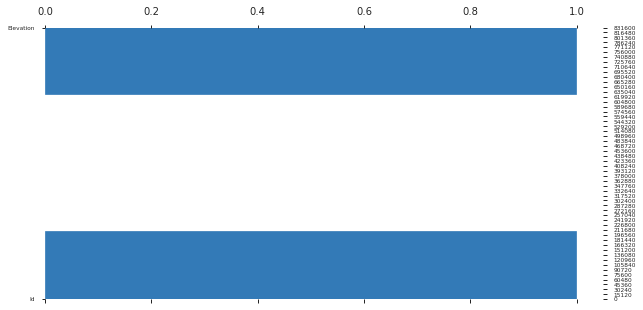

In [8]:
from pandas_profiling import ProfileReport
report = ProfileReport(data, minimal=False)
report

* __ID__: As unique values, consider dropping it from the analysis.<br>
* __Elevation__: Has very few values above 3500meters, which makes sense as the higher the altitude the less tree grow there.<br>
* __Aspect__: Has high correlation with the Hillshade variables<br>
* __Slope__: Has high correlation with the Hillshade variables, there seem to be values outside the norm around 25degrees<br>
* __Cover_Type__: Cover Type are equal distributed, each Cover Type are represented in an equally.<br>
* __Soil_Type15__ and __Soil_Type7__: No values, consider removing them but first check if these are also exist in the testing data to confirm our thought. <br>
* __Soil_Type28,36,25,9 and 8__: Very few values, seems to be rather scare soil types. <br>

Checking if the Soil_Type 15 and Soil_Type7 should be removed based on the test data. Since both do exist with values in the test set, we cannot remove them as they might be significant for further analysis. 

In [9]:
data_test = pd.read_csv("test.csv")

In [10]:
data_test['Soil_Type15'].value_counts()

0    565889
1         3
Name: Soil_Type15, dtype: int64

In [11]:
data_test['Soil_Type7'].value_counts()

0    565787
1       105
Name: Soil_Type7, dtype: int64

The numerical variables seem to not be normal distributed. All variables though are not normal distributed, which will be tested with the statistical Shapiro test below. All features are more skewed.   The features that measure distance are positively skewed. Hillshade 9 am and Noon has a similar left-skewed distribution. None of the features follow a normal distribution, which is confirmed by the statistical Shapiro test for normality.

### Shapiro Test 

The numerical variables seem to not be normal distributed in the Pandas Profiling Report. However we will test this with the Shapiro test below and it confirms the initial analysis that the features do not follow a Gaussian Distribution at a significance level of 95%. All features are skewed. 

In [12]:
# D'Agostino and Pearson's Test
from scipy.stats import normaltest
alpha = 0.05
for i in (['Elevation','Aspect','Slope','Horizontal_Distance_To_Hydrology','Vertical_Distance_To_Hydrology','Horizontal_Distance_To_Roadways','Hillshade_9am','Hillshade_Noon','Hillshade_3pm','Horizontal_Distance_To_Fire_Points']):
    print ()
    print (i)
    stat, p = normaltest(data[[i]])
    print('Statistics=%.3f, p=%.3f' % (stat, p))
    if p > alpha:
        print('The data follows Gaussian Distribution (fail to reject H0)')
    else:
        print('The data does not follow Gaussian Distribution  (reject H0)')


Elevation
Statistics=5560.372, p=0.000
The data does not follow Gaussian Distribution  (reject H0)

Aspect
Statistics=9254.059, p=0.000
The data does not follow Gaussian Distribution  (reject H0)

Slope
Statistics=659.561, p=0.000
The data does not follow Gaussian Distribution  (reject H0)

Horizontal_Distance_To_Hydrology
Statistics=4118.478, p=0.000
The data does not follow Gaussian Distribution  (reject H0)

Vertical_Distance_To_Hydrology
Statistics=4454.210, p=0.000
The data does not follow Gaussian Distribution  (reject H0)

Horizontal_Distance_To_Roadways
Statistics=2766.766, p=0.000
The data does not follow Gaussian Distribution  (reject H0)

Hillshade_9am
Statistics=2427.368, p=0.000
The data does not follow Gaussian Distribution  (reject H0)

Hillshade_Noon
Statistics=2021.620, p=0.000
The data does not follow Gaussian Distribution  (reject H0)

Hillshade_3pm
Statistics=282.570, p=0.000
The data does not follow Gaussian Distribution  (reject H0)

Horizontal_Distance_To_Fire_P

### Variable Completness

Check for completness of data of Wilderness. Since Wilderness is One Hot Encoded, we want to check if all the values sum up to 15120 or if we have values which are entered as zero or even 1, meaning the values are entered twice in two different Wilderness. The below show that the values are all together sum up t0 15120, which shows us the completness of the Wilderness area and uniquiness of the wilderness area. 

In [13]:
data.iloc[:,11:15].sum(axis=1).sum()

15120

Same for the Soil, we check if the data is adding up to 15120 to see if there are values entered as zero and actually give us missing information. SAme for the Soil Data, the data is complete and there are no entered values with zero. 

In [14]:
data.iloc[:,15:55].sum(axis=1).sum()

15120

### Correlation Matrix
Looking at the features which are highly correlated with a threshold above 0.5: <br>
* __Vertical_Distance_To_Hydrology__ positivly correlated to __Horizontal_Distance_To_Hydrology__ <br>
* __Horizontal_Distance_To_Roadways__ positivly correlated to __Elevation__  <br>
* __Hillshade_9am__ negativly correlated and __Hillshade_3pm__ positivly correlated to __Aspect__<br>
* __Hillshade_Noon__ negativly correlated to __Slope__<br>
* __Hillshade variables__ are also correlated between themselves,but Hillshade 3pm and Hillshade 9am are negative correlated <br>
* __Wilderness Area 4__ is highly correlated with Elevation <br>

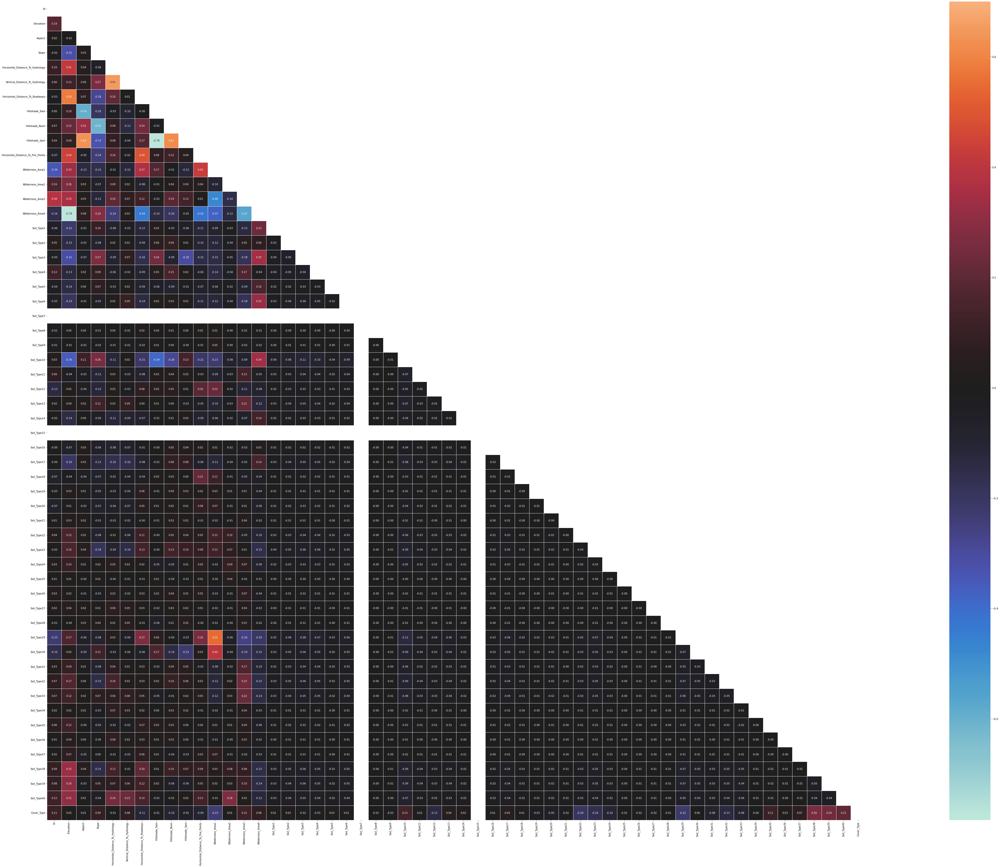

In [15]:
#Heatmap 
matrix = data.corr()
mask = np.zeros_like(matrix)
mask[np.triu_indices_from(mask)] = True
fig, ax = plt.subplots(figsize=(120,60))
heatmap = sns.heatmap(matrix, center=0, fmt=".2f", square=True, annot=True, linewidth=.9, mask = mask,vmax=.7);
plt.show()

C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\

C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\

C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\

C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\

C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\

C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\

C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\

C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\

C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\

C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\

C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\

C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\

C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Stephanie\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


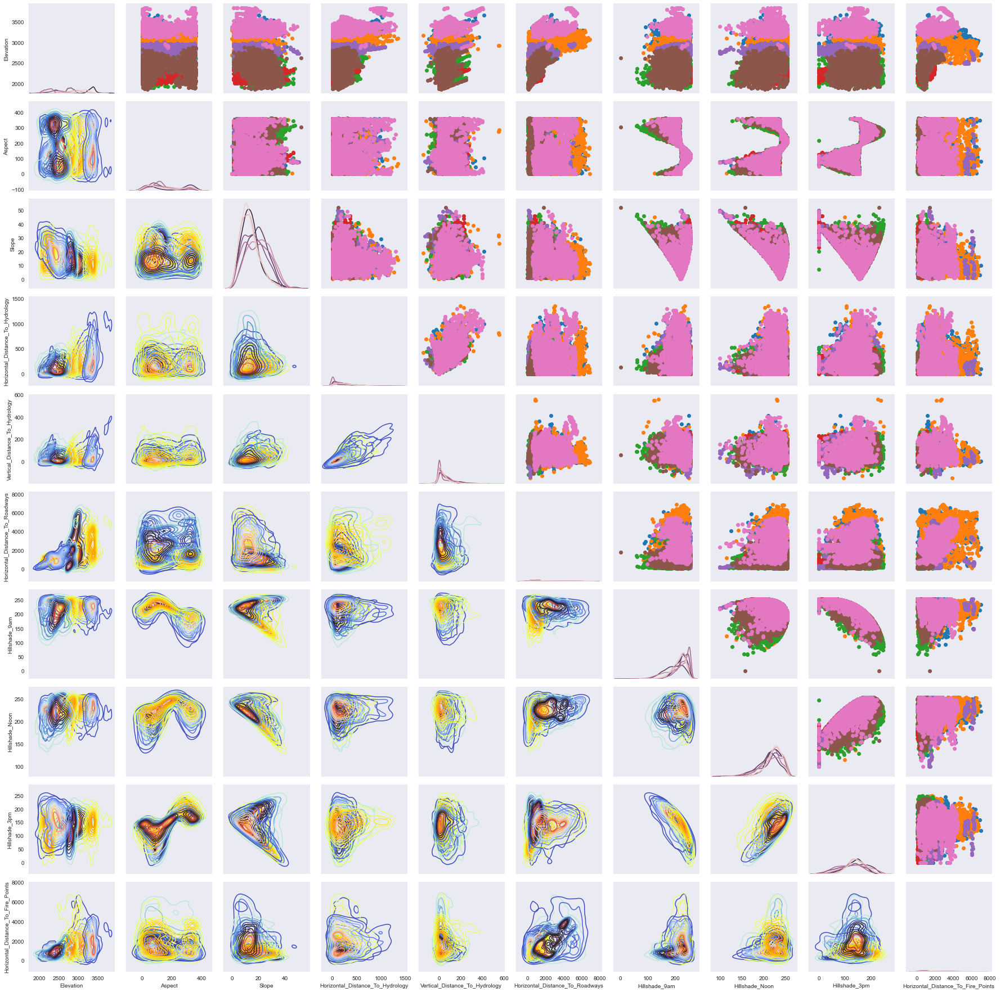

In [16]:
from itertools import cycle
sns.set_style('dark')
def make_kde(*args,**kwargs):
    sns.kdeplot(*args, cmap=next(make_kde.cmap_cycle), **kwargs)
make_kde.cmap_cycle = cycle(('coolwarm', 'Wistia', 'icefire'))
our_plot = sns.PairGrid(data, vars = ['Elevation','Aspect','Slope','Horizontal_Distance_To_Hydrology','Vertical_Distance_To_Hydrology','Horizontal_Distance_To_Roadways','Hillshade_9am','Hillshade_Noon','Hillshade_3pm','Horizontal_Distance_To_Fire_Points'], hue='Cover_Type', dropna=True)
our_plot.map_diag(sns.kdeplot)
our_plot.map_lower(make_kde)
our_plot.map_upper(plt.scatter)

In [17]:
# Performing reverse One Hot Encoding using Pandas idxmax ( variables used for EDA and Data analysis only)
data['Wildness'] = (data.iloc[:, 11:15] == 1).idxmax(1)
data['Soil'] = (data.iloc[:, 15:56] == 1).idxmax(1)

In [18]:
data['Cover_Type1'] = data['Cover_Type'].replace([1,2,3,4,5,6,7],['Spruce/Fir','Lodgepole Pine','Ponderosa Pine','Cottonwood/Willow','Aspen','Douglas-fir','Krummholz'])
data

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type,Wildness,Soil,Cover_Type1
0,1,2596,51,3,258,0,510,221,232,148,...,0,0,0,0,0,0,5,Wilderness_Area1,Soil_Type29,Aspen
1,2,2590,56,2,212,-6,390,220,235,151,...,0,0,0,0,0,0,5,Wilderness_Area1,Soil_Type29,Aspen
2,3,2804,139,9,268,65,3180,234,238,135,...,0,0,0,0,0,0,2,Wilderness_Area1,Soil_Type12,Lodgepole Pine
3,4,2785,155,18,242,118,3090,238,238,122,...,0,0,0,0,0,0,2,Wilderness_Area1,Soil_Type30,Lodgepole Pine
4,5,2595,45,2,153,-1,391,220,234,150,...,0,0,0,0,0,0,5,Wilderness_Area1,Soil_Type29,Aspen
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15115,15116,2607,243,23,258,7,660,170,251,214,...,0,0,0,0,0,0,3,Wilderness_Area3,Soil_Type4,Ponderosa Pine
15116,15117,2603,121,19,633,195,618,249,221,91,...,0,0,0,0,0,0,3,Wilderness_Area3,Soil_Type4,Ponderosa Pine
15117,15118,2492,134,25,365,117,335,250,220,83,...,0,0,0,0,0,0,3,Wilderness_Area3,Soil_Type4,Ponderosa Pine
15118,15119,2487,167,28,218,101,242,229,237,119,...,0,0,0,0,0,0,3,Wilderness_Area3,Soil_Type4,Ponderosa Pine


<a id='2.1'></a>
## <font color=green>__2.?.Categorial EDA__</font><br>

 __Area1__ has four dominant Cover types: Mainly Lodgepole Pine, Spruce/Fir, Aspen and bit Krummholz. <br>
 __Area2__ has three Cover Types but are small in numbers: Krummholz, Spruce/Fir and Lodgepole Pine. <br>
 __Area3__ has six Cover Types in decreasing order Krummholz, Aspen, Douglas-fir, Lodgepole Pine, Spruce/Fir and Ponderosa Pine.<br>
 __Area4__ has four dominant Cover types in decreasing order: Cottonwood/Willow, Ponderosa Pine, Douglas-fir and Lodgepole Pine. 

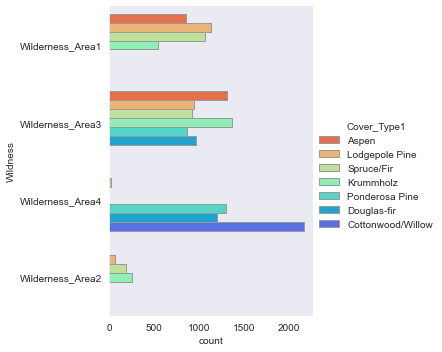

In [19]:
sns.catplot(y="Wildness", hue='Cover_Type1', kind="count",
            palette='rainbow_r', edgecolor=".6",
            data=data)

Highlights only: 
There are few Soil Types where there are few Cover Types or not existing cover Types, most of them are stony soil types like Soil Types 18,24,5,9,28,34,37,36,26,27 and 25. Few are from other soil types like 16,20,19,8 and 21. <br>
__Soil_Type3__ (Haploborolis - Rock outcrop complex, rubbly) : Mainly Cover Type __Cottonwood__ <br>
__Soil_Type4__ (Ratake family - Rock outcrop complex, rubbly) :__Ponderosa Pine__ <br>
__Soil_Type10__ (Bullwark - Catamount families - Rock outcrop complex, rubbly): Mainly __Douglas-fir and Ponderosa Pine__ <br>
__Soil_Type23__ (Leighcan family, till substratum - Typic Cryaquolls complex): Mainly __Spruce/Fir__<br>
__Soil_Type29__ (Como - Legault families complex, extremely stony) : __Lodgepole Pine, Spruce/Fir__<br>
__Soil_Type30__ (Como family - Rock land - Legault family complex, extremely stony): __Aspen__<br>
__Soil_Type38__ (Leighcan - Moran families - Cryaquolls complex, extremely stony): Mainly __Krummholz__<br>
__Soil_Type39__ (Moran family - Cryorthents - Leighcan family complex, extremely stony): Mainly __Krummholz__<br>
__Soil_Type40__ (Moran family - Cryorthents - Rock land complex, extremely stony): Mainly __Krummholz__

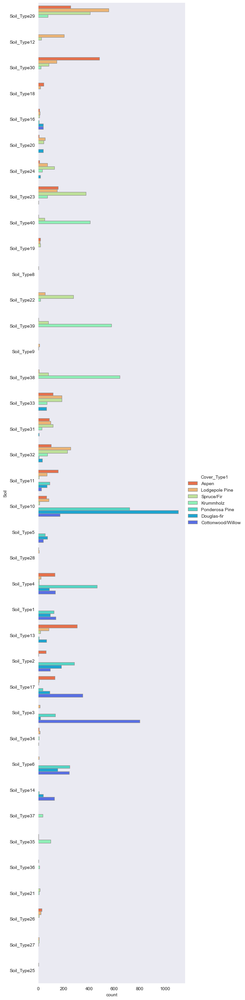

In [20]:
sns.catplot(y="Soil", hue='Cover_Type1', kind="count",
            palette='rainbow_r', edgecolor=".6",
            data=data,height=30, aspect=0.2)

### <font color=green>Violinplot with Dependent Variable </font><br>

Violinplot shows the distribution of the Cover_Types against the numerical variables: 

1. __Spruce/Fir__: Slope is lower <br>
2. __Lodgepole Pine__: Slope is lower <br>
3. __Ponderosa Pine__: closer to the road than other cover types<br>
4. __Cottonwood/Willow__:closer to the road than other cover types, found on lower elevation, lowest horizontal distance to hydrology is lower and less spread than the other coverTypes, vertical distance to hydrology is more above the sea level than below, Hildshade 9am is high<br>
5. __Aspen__: Hildshade 9am is high <br>
6. __Douglas-fir__: closer to the road than other cover types, Hildshade 9am is very spread<br>
7. __Krummholz__: found on higher elevation, Slope is lower <br>

* Elevation has the highest variance among the different Cover_Types
* Aspect on the other hand is fairly equally spread among the different Cover_Types 

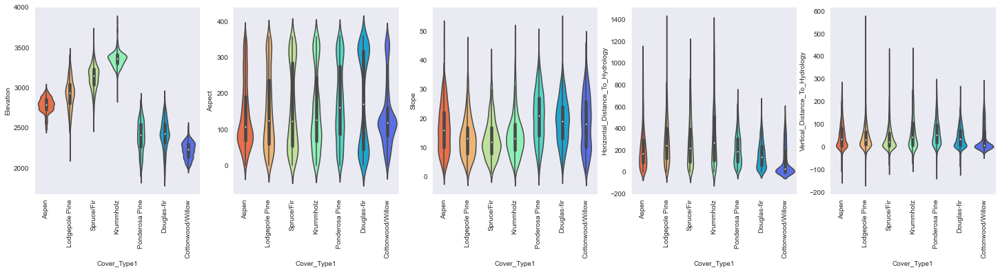

In [21]:
vars= ['Elevation','Aspect','Slope','Horizontal_Distance_To_Hydrology','Vertical_Distance_To_Hydrology']
fig, axs = plt.subplots(1, len(vars), figsize=(25,5))
for i in range(0,len(vars)):
    sns.violinplot( y=data[vars[i]],x=data['Cover_Type1'], data=data,ax=axs[i],palette = 'rainbow_r')
    for tick in axs[i].get_xticklabels():
        tick.set_rotation(90)

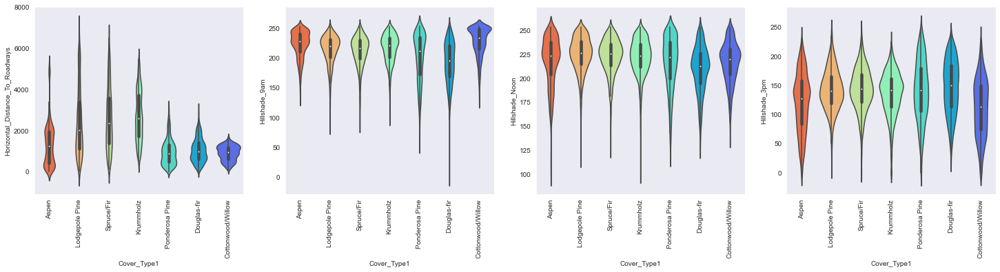

In [22]:
vars= ['Horizontal_Distance_To_Roadways','Hillshade_9am','Hillshade_Noon','Hillshade_3pm','Horizontal_Distance_To_Fire_Points']
fig, axs = plt.subplots(1, len(vars)-1, figsize=(25,5))
for i in range(0,len(vars)-1):
    sns.violinplot( y=data[vars[i]],x=data['Cover_Type1'], data=data,ax=axs[i],palette = 'rainbow_r')
    for tick in axs[i].get_xticklabels():
        tick.set_rotation(90)

<a id='2.1'></a>
### <font color=green>Treemap for categorial Data </font><br>
In order to see the distribution of the treemap features we are checking which features are more represented than others.<br>
You can see on the Soil Type that Soil Type 10 is represented the most, than Soil Type 29 and then Soil Type 3. 

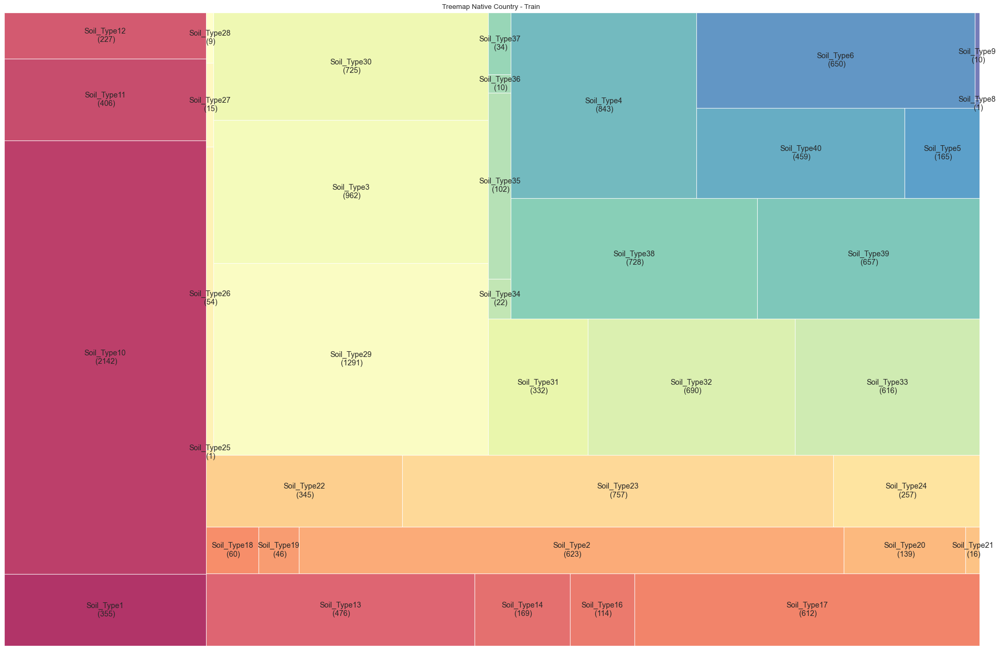

In [23]:
# Prepare Data
df = data.groupby('Soil').size().reset_index(name='counts')
labels = df.apply(lambda x: str(x[0]) + "\n (" + str(x[1]) + ")", axis=1)
sizes = df['counts'].values.tolist()
colors = [plt.cm.Spectral(i/float(len(labels))) for i in range(len(labels))]

# Draw Plot
plt.figure(figsize=(30,20), dpi= 80)
squarify.plot(sizes=sizes, label=labels, color=colors, alpha=.8,text_kwargs={'fontsize':13})

# Decorate
plt.title('Treemap Native Country - Train ')
plt.axis('off')
plt.show()

For the Wilderness Area: Wilderness Area 3 is highly represented (42%), then Area 4 (31%) , Area 1 (24%) and Area 2 (3%). 

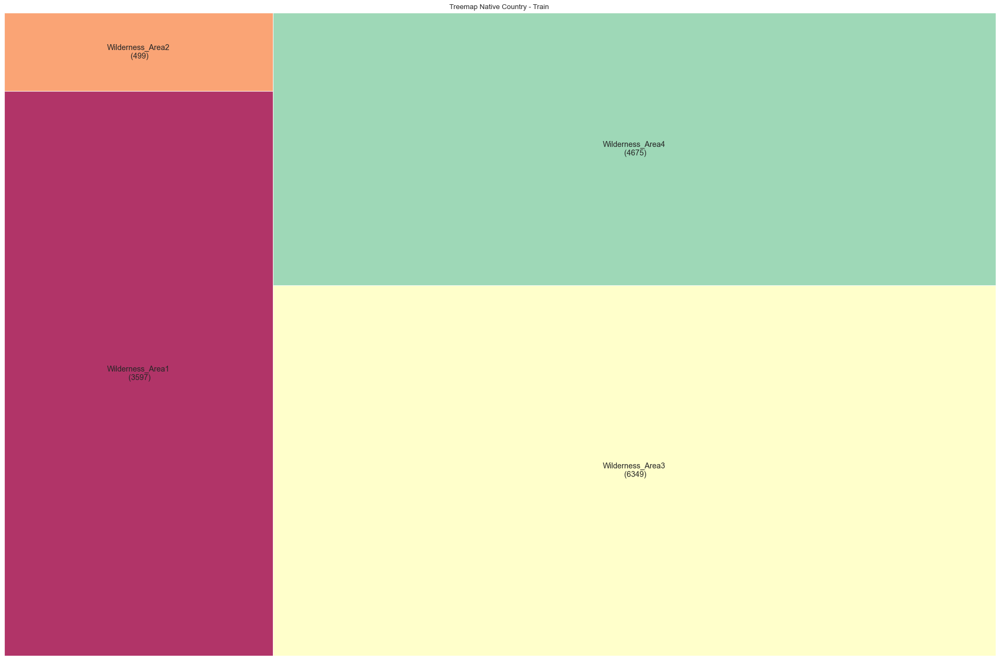

In [24]:
# Prepare Data
df = data.groupby('Wildness').size().reset_index(name='counts')
labels = df.apply(lambda x: str(x[0]) + "\n (" + str(x[1]) + ")", axis=1)
sizes = df['counts'].values.tolist()
colors = [plt.cm.Spectral(i/float(len(labels))) for i in range(len(labels))]

# Draw Plot
plt.figure(figsize=(30,20), dpi= 80)
squarify.plot(sizes=sizes, label=labels, color=colors, alpha=.8,text_kwargs={'fontsize':13})

# Decorate
plt.title('Treemap Native Country - Train ')
plt.axis('off')
plt.show()

As already seen in the Pandas Profiling Report Cover Type is equally distributed. 

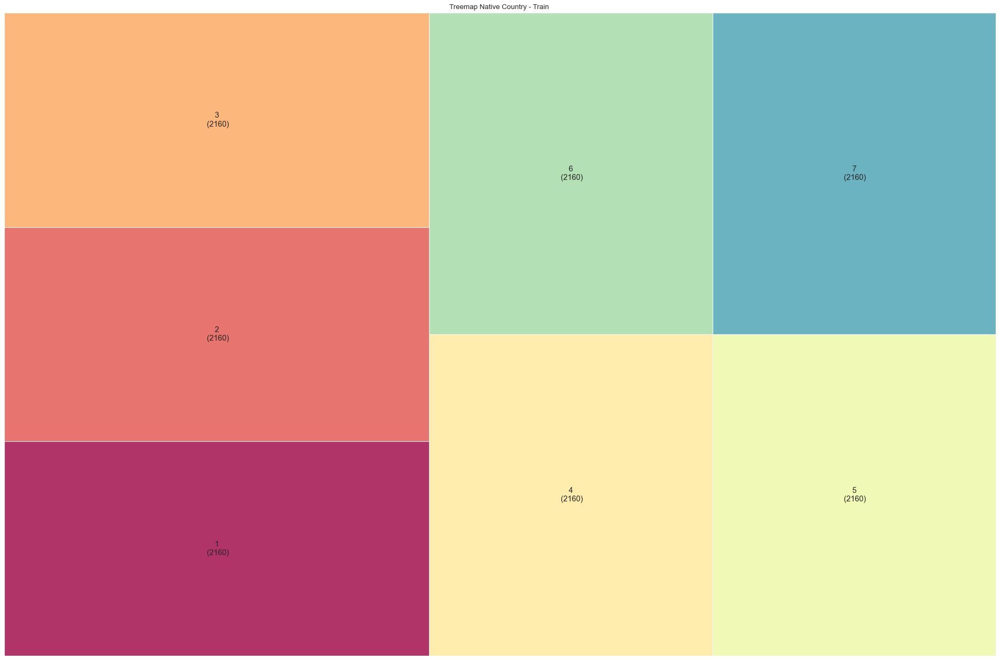

In [25]:
# Prepare Data
df = data.groupby('Cover_Type').size().reset_index(name='counts')
labels = df.apply(lambda x: str(x[0]) + "\n (" + str(x[1]) + ")", axis=1)
sizes = df['counts'].values.tolist()
colors = [plt.cm.Spectral(i/float(len(labels))) for i in range(len(labels))]

# Draw Plot
plt.figure(figsize=(30,20), dpi= 80)
squarify.plot(sizes=sizes, label=labels, color=colors, alpha=.8,text_kwargs={'fontsize':13})

# Decorate
plt.title('Treemap Native Country - Train ')
plt.axis('off')
plt.show()

<a id='3'></a>
# <font color=green> 3.Feature Engineering <font>

### <font color=green> 3.1 Check for Anomalies and Outliers <font>

Since the z-score is sensitive to the  mean and standard deviation and its assumption of a normally distributed variable, we cannot use the z-score for outlier handleing. The disadvantage using percentile it consoders always and outlier of the lowest or highest value, even there are no outliers. As the number of observations increases, so does the number of observations considered outliers; After all, using a percentile based method will always flat-out reject a certain percentage of our observations.Thus, we are using the alternative method __Modified Z-score method__.

However, it also considers as an outlier the lowest value; This is a consequence of using percentile based methods  
Using standard deviation from the mean to check for outliers. The advantage of using standard deviation from the mean is it will not give us outliers for each features but the disadvantage is the mean is subject to skewed data. Thus, the analysis needs to be taken with care. Also use  use percentiles for completness and comparison of outliers. 

In [26]:
import numpy as np
import pandas as pd

def detect_outlier(data_1):
    outliers=[]

    
    threshold=3
    mean_1 = np.mean(data_1)
    std_1 =np.std(data_1)
    if std_1 == 0:
        return outliers
    
    
    for y in data_1:
        z_score= (y - mean_1)/std_1 
        if np.abs(z_score) > threshold:
            outliers.append(y) 
    return outliers

The dummies variables should be taken with care as these are binary values and all the values if detected will be outliers. 

In [27]:
for column in data.columns:
    outlier_datapoints = detect_outlier(data[column])
    if len(outlier_datapoints) != 0:
        print(f'There are {len(outlier_datapoints)} outliers in {column}')

There are 39 outliers in Slope
There are 285 outliers in Horizontal_Distance_To_Hydrology
There are 213 outliers in Vertical_Distance_To_Hydrology
There are 155 outliers in Horizontal_Distance_To_Roadways
There are 160 outliers in Hillshade_9am
There are 129 outliers in Hillshade_Noon
There are 331 outliers in Horizontal_Distance_To_Fire_Points
There are 499 outliers in Wilderness_Area2
There are 355 outliers in Soil_Type1
There are 623 outliers in Soil_Type2
There are 962 outliers in Soil_Type3
There are 843 outliers in Soil_Type4
There are 165 outliers in Soil_Type5
There are 650 outliers in Soil_Type6
There are 1 outliers in Soil_Type8
There are 10 outliers in Soil_Type9
There are 406 outliers in Soil_Type11
There are 227 outliers in Soil_Type12
There are 476 outliers in Soil_Type13
There are 169 outliers in Soil_Type14
There are 114 outliers in Soil_Type16
There are 612 outliers in Soil_Type17
There are 60 outliers in Soil_Type18
There are 46 outliers in Soil_Type19
There are 139 o

TypeError: Could not convert Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area4Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area4Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area1Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area1Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area2Wilderness_Area2Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area2Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3Wilderness_Area3 to numeric

The IQR is the difference between the 75th and 25th percentile. The IQR is more resistant to outliers. The IQR by definition only covers the middle 50% of the data, so outliers are well outside this range and the presence of a small number of outliers is not likely to change this significantly. If you add an outlier, the IQR will change to another set of data points that are probably not that dissimilar to the previous ones (in most datasets), hence it is “resistant” to change. This is especially the case of a large dataset.

Now if you add some crazy extreme data point at the end, the 75th and 25th percentile doesn’t change much, because extreme outliers or no, 75% of the data still lies below roughly the same amount.

In [ ]:
def outlier_function(df, col_name):
    ''' this function detects first and third quartile and interquartile range for a given column of a dataframe
    then calculates upper and lower limits to determine outliers conservatively
    returns the number of lower and uper limit and number of outliers respectively
    '''
    first_quartile = np.percentile(np.array(df[col_name].tolist()), 25)
    third_quartile = np.percentile(np.array(df[col_name].tolist()), 75)
    IQR = third_quartile - first_quartile
                      
    upper_limit = third_quartile+(3*IQR)
    lower_limit = first_quartile-(3*IQR)
    outlier_count = 0
                      
    for value in df[col_name].tolist():
        if (value < lower_limit) | (value > upper_limit):
            outlier_count +=1
    return lower_limit, upper_limit, outlier_count

In [ ]:
# loop through all columns to see if there are any outliers
for i in data.columns:
    if outlier_function(data, i)[2] > 0:
        print("There are {} outliers in {}".format(outlier_function(data, i)[2], i))
        print(f'There are {outlier_function(data, i)[2]} outliers in {i}')

### Null Values
Since this dataset has no null values, we do not need to handle them. 

#### Drop ID as it has unique value 

In [ ]:
data.drop('Id',axis = 1, inplace = True)

#### Distance To Hydrology

We combine Vertical distance to Hydrology and Horizontal distance to Hydrology since these two are highly correlated and also we can transform it into one variable which would give the distance to the closest water surface and using Pythagoras 
theorem yield for Distance calculation, since we have the horizontal and the vertical Distance. 

In [ ]:
data['Distance_To_Hydrology'] = data['Horizontal_Distance_To_Hydrology']**2 +data['Vertical_Distance_To_Hydrology']**2
data['Distance_To_Hydrology'] = data['Distance_To_Hydrology']**0.5
data

In [ ]:
data['Horizontal_Distance_To_Roadways1'] = data['Horizontal_Distance_To_Roadways']**0.5
data['log_Horizontal_Distance_To_Roadways'] = np.log(data['Horizontal_Distance_To_Roadways'])
data['log10_Horizontal_Distance_To_Roadways'] = np.log10(data['Horizontal_Distance_To_Roadways'])

In [ ]:
data

In [ ]:
data['Horizontal_Distance_To_Roadways1'].hist()

In [ ]:
data['log10_Horizontal_Distance_To_Roadways'].hist()

In [ ]:
import math

In [ ]:
math.log()

Using Discretization to bin the soil variable to the family type.
Family 1: 
1 Cathedral family - Rock outcrop complex, extremely stony.<br>

Family 2: 
2 Vanet - Ratake families complex, very stony.<br>
4 Ratake family - Rock outcrop complex, rubbly.<br>
5 Vanet family - Rock outcrop complex complex, rubbly.<br>
6 Vanet - Wetmore families - Rock outcrop complex, stony.<br>

family 3 
3 Haploborolis - Rock outcrop complex, rubbly.<br>

family 4
7 Gothic family.<br
                    
family 5
8 Supervisor - Limber families complex.<br>

9 Troutville family, very stony.<br>
12 Legault family - Rock land complex, stony.<br>
14 Pachic Argiborolis - Aquolis complex.<br>
15 unspecified in the USFS Soil and ELU Survey.<br>
17 Gateview family - Cryaquolis complex.<br>
18 Rogert family, very stony.<br>
20 Typic Cryaquepts - Typic Cryaquolls complex.<br>
29 Como - Legault families complex, extremely stony.<br>
30 Como family - Rock land - Legault family complex, extremely stony.<br>
34 Cryorthents - Rock land complex, extremely stony.<br>
35 Cryumbrepts - Rock outcrop - Cryaquepts complex.<br>
36 Bross family - Rock land - Cryumbrepts complex, extremely stony.<br>
37 Rock outcrop - Cryumbrepts - Cryorthents complex, extremely stony.<br>


family 6 
10 Bullwark - Catamount families - Rock outcrop complex, rubbly.<br>
11 Bullwark - Catamount families - Rock land complex, rubbly.<br>


7
13 Catamount family - Rock land - Bullwark family complex, rubbly.<br>
26 Granile - Catamount families complex, very stony.<br>
32 Catamount family - Rock outcrop - Leighcan family complex, extremely stony.<br>
31 Leighcan - Catamount families complex, extremely stony.<br>
33 Leighcan - Catamount families - Rock outcrop complex, extremely stony.<br>

8
16 Cryaquolis - Cryoborolis complex.<br>
19 Typic Cryaquolis - Borohemists complex.<br>


Leighcan 
21 Typic Cryaquolls - Leighcan family, till substratum complex.<br>
22 Leighcan family, till substratum, extremely bouldery.<br>
23 Leighcan family, till substratum - Typic Cryaquolls complex.<br>
24 Leighcan family, extremely stony.<br>
25 Leighcan family, warm, extremely stony.<br>
27 Leighcan family, warm - Rock outcrop complex, extremely stony.<br>
28 Leighcan family - Rock outcrop complex, extremely stony.<br>


Moran 
38 Leighcan - Moran families - Cryaquolls complex, extremely stony.<br>
39 Moran family - Cryorthents - Leighcan family complex, extremely stony.<br>
40 Moran family - Cryorthents - Rock land complex, extremely stony.<br>

In [ ]:
We will group the soil types according to their family and according to the complex and stonyness

In [ ]:
1 Cathedral family - Rock outcrop complex, extremely stony.<br>
2 Vanet - Ratake families complex, very stony.<br>
3 Haploborolis - Rock outcrop complex, rubbly.<br>
4 Ratake family - Rock outcrop complex, rubbly.<br>
5 Vanet family - Rock outcrop complex complex, rubbly.<br>
6 Vanet - Wetmore families - Rock outcrop complex, stony.<br>
7 Gothic family.<br>
8 Supervisor - Limber families complex.<br>
9 Troutville family, very stony.<br>
10 Bullwark - Catamount families - Rock outcrop complex, rubbly.<br>
11 Bullwark - Catamount families - Rock land complex, rubbly.<br>
12 Legault family - Rock land complex, stony.<br>
13 Catamount family - Rock land - Bullwark family complex, rubbly.<br>
14 Pachic Argiborolis - Aquolis complex.<br>
15 unspecified in the USFS Soil and ELU Survey.<br>
16 Cryaquolis - Cryoborolis complex.<br>
17 Gateview family - Cryaquolis complex.<br>
18 Rogert family, very stony.<br>
19 Typic Cryaquolis - Borohemists complex.<br>
20 Typic Cryaquepts - Typic Cryaquolls complex.<br>
21 Typic Cryaquolls - Leighcan family, till substratum complex.<br>
22 Leighcan family, till substratum, extremely bouldery.<br>
23 Leighcan family, till substratum - Typic Cryaquolls complex.<br>
24 Leighcan family, extremely stony.<br>
25 Leighcan family, warm, extremely stony.<br>
26 Granile - Catamount families complex, very stony.<br>
27 Leighcan family, warm - Rock outcrop complex, extremely stony.<br>
28 Leighcan family - Rock outcrop complex, extremely stony.<br>
29 Como - Legault families complex, extremely stony.<br>
30 Como family - Rock land - Legault family complex, extremely stony.<br>
31 Leighcan - Catamount families complex, extremely stony.<br>
32 Catamount family - Rock outcrop - Leighcan family complex, extremely stony.<br>
33 Leighcan - Catamount families - Rock outcrop complex, extremely stony.<br>
34 Cryorthents - Rock land complex, extremely stony.<br>
35 Cryumbrepts - Rock outcrop - Cryaquepts complex.<br>
36 Bross family - Rock land - Cryumbrepts complex, extremely stony.<br>
37 Rock outcrop - Cryumbrepts - Cryorthents complex, extremely stony.<br>
38 Leighcan - Moran families - Cryaquolls complex, extremely stony.<br>
39 Moran family - Cryorthents - Leighcan family complex, extremely stony.<br>
40 Moran family - Cryorthents - Rock land complex, extremely stony.<br>
Source: https://www.kaggle.com/competitions/forest-cover-type-prediction/data